# 0.0 - Imports

In [1]:
import warnings
import itertools
import numpy               as np
import pandas              as pd
import seaborn             as sns
import matplotlib.pyplot   as plt
import plotly.express      as px
  
from datetime              import datetime
from prophet               import Prophet
from pandas.api.types      import CategoricalDtype
from IPython.display       import display, HTML
from prophet               import Prophet
from prophet.plot          import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from sklearn.metrics       import mean_squared_error, mean_absolute_error
from sklearn.impute        import SimpleImputer
from prophet.diagnostics import cross_validation, performance_metrics

# 0.1 - Helper Functions

In [2]:
# Set the width of the container
display(HTML("<style>.container { width:100% !important; }</style>"))

# Adjust the output area for better display without causing overlap
display(HTML("""
<style>
.output {
    display: block;
    width: 100% !important;
    max-height: 1000px !important;
    overflow-y: auto;
}
.output_area {
    width: 100% !important;
    max-height: 1000px !important;
}
</style>
"""))


warnings.filterwarnings("ignore")

plt.style.use('ggplot')
plt.style.use('fivethirtyeight')

def mean_absolute_percentage_error(y_true, y_pred):
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


weekday_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}


def create_features(df):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['weekday'] = df['dayofweek']
    df['weekday_name'] = df['dayofweek'].map(weekday_map)
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week

    # Definir as estações do ano com base nas datas específicas de cada ano
    df['season'] = 'Winter'  # Default to Winter
    df.loc[(df['date'] >= df.apply(lambda row: pd.Timestamp(year=row['year'], month=3, day=20), axis=1)) & (df['date'] < df.apply(lambda row: pd.Timestamp(year=row['year'], month=6, day=21), axis=1)), 'season'] = 'Spring'
    df.loc[(df['date'] >= df.apply(lambda row: pd.Timestamp(year=row['year'], month=6, day=21), axis=1)) & (df['date'] < df.apply(lambda row: pd.Timestamp(year=row['year'], month=9, day=23), axis=1)), 'season'] = 'Summer'
    df.loc[(df['date'] >= df.apply(lambda row: pd.Timestamp(year=row['year'], month=9, day=23), axis=1)) & (df['date'] < df.apply(lambda row: pd.Timestamp(year=row['year'], month=12, day=22), axis=1)), 'season'] = 'Fall'
    df.loc[(df['date'] >= df.apply(lambda row: pd.Timestamp(year=row['year'], month=12, day=22), axis=1)) | (df['date'] < df.apply(lambda row: pd.Timestamp(year=row['year'], month=3, day=20), axis=1)), 'season'] = 'Winter'
    
    season_map = {'Winter': 4, 'Spring': 1, 'Summer': 2, 'Fall': 3}
    df['season'] = df['season'].map(season_map).astype('int64')
    
    return df



# 0.1 - Data

In [3]:
dfs = []

for i in range(2002, 2019):
    file = rf"C:\Users\gfurt\Ciência de dados\Séries temporais\inmet_prophet\Dados\INMET_SE_RJ_A601_ECOLOGIA AGRICOLA_01-01-{i}_A_31-12-{i}.csv"
    df = pd.read_csv(file, encoding='ISO-8859-1', delimiter=';', skiprows=8)
    dfs.append(df)
    
df_raw_1 = pd.concat(dfs, ignore_index=True)

In [4]:
cols = df_raw_1.columns
dfs = []

for i in range(2019, 2024):
    file = rf"C:\Users\gfurt\Ciência de dados\Séries temporais\inmet_prophet\Dados\INMET_SE_RJ_A601_SEROPEDICA-ECOLOGIA AGRICOLA_01-01-{i}_A_31-12-{i}.csv"
    df = pd.read_csv(file, encoding='ISO-8859-1', delimiter=';', skiprows=9,
                     names=cols)
    dfs.append(df)
    
df_raw_2 = pd.concat(dfs, ignore_index=True)

In [5]:
df_raw_2['HORA (UTC)'] = df_raw_2['HORA (UTC)'].str[:4]
df_raw_2['HORA (UTC)'] = df_raw_2['HORA (UTC)'].apply(lambda x: datetime.strptime(x, '%H%M').strftime('%H:%M'))

In [6]:
# Convertendo a coluna 'DATA (YYYY-MM-DD)' em df_raw_1 para datetime
df_raw_1['DATA (YYYY-MM-DD)'] = pd.to_datetime(df_raw_1['DATA (YYYY-MM-DD)'])

# Convertendo a coluna 'DATA (YYYY-MM-DD)' em df_raw_2 para datetime
df_raw_2['DATA (YYYY-MM-DD)'] = pd.to_datetime(df_raw_2['DATA (YYYY-MM-DD)'])

In [7]:
df_raw = pd.concat([df_raw_1, df_raw_2], ignore_index=True)

# 1.0 - Data description

In [8]:
df1 = df_raw.copy()

In [9]:
df1.shape

(192840, 20)

In [10]:
df1[['DATA (YYYY-MM-DD)', 'HORA (UTC)', 'TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)']].dtypes

DATA (YYYY-MM-DD)                               datetime64[ns]
HORA (UTC)                                              object
TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)            object
dtype: object

In [11]:
# Identifying missing values
df1[['DATA (YYYY-MM-DD)', 'HORA (UTC)', 'TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)']].isnull().sum()

DATA (YYYY-MM-DD)                                 0
HORA (UTC)                                        0
TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)    962
dtype: int64

In [12]:
# Identifying Outliers

df_aux = df1.copy()
df_aux['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'] = df_aux['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'].str.replace(',', '.').astype(float)
df_aux_counts = df_aux['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'].value_counts().reset_index()
df_aux_sorted = df_aux_counts.sort_values(by='TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)')

In [13]:
df_aux_sorted.head(10)

,"TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)",count
0,-9999.0,8625
318,8.6,1
315,8.8,1
314,8.9,1
316,9.0,1
317,9.1,1
296,9.3,3
308,9.4,2
293,9.5,4
295,9.6,3


In [14]:
df_aux_sorted.tail(10)

,"TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)",count
306,40.3,2
302,40.4,3
312,40.5,1
311,40.6,1
310,40.7,1
313,40.8,1
319,41.2,1
309,41.3,1
320,41.5,1
321,42.4,1


# 2.0 - Feature engineering

In [15]:
df2 = df1.copy()

In [16]:
# Convertendo a coluna 'Hora' para timedelta, considerando que o formato seja '00:00'
df2['HORA (UTC)'] = pd.to_timedelta(df2['HORA (UTC)'] + ':00')

# Criando a coluna 'Data_Hora' combinando 'Data' e 'Hora'
df2['Data_Hora'] = df2['DATA (YYYY-MM-DD)'] + df2['HORA (UTC)']

In [17]:
df2['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'] = df2['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'].str.replace(',', '.').astype(float)

In [18]:
df2['Data_Hora'] = pd.to_datetime(df2['Data_Hora'])

In [19]:
imputer = SimpleImputer(strategy='mean')

df2['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'] = df2['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'].replace(-9999, np.nan)
df2['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'] = imputer.fit_transform(df2[['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)']])

- Different methods were used to fill in the missing data, such as mean imputation, median imputation, forward fill, backward fill, and interpolation, but all produced very similar results. Therefore, the method with lower processing requirements was chosen.

In [20]:
df2 = df2[['Data_Hora', 'TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)']]
df2 = df2.set_index('Data_Hora')

In [21]:
df2 = create_features(df2)

# 3.0 - Data Cleaning

In [22]:
df3 = df2.copy()

In [23]:
count_error = df3[df3['TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)'] == -9999].shape[0]

print(f'Number of incorrectly marked temperatures (-9999) = {count_error}')

Number of incorrectly marked temperatures (-9999) = 0


# 4.0 - Exploratory Data Analysis

In [24]:
df4 = df3.copy()

# 5.0 - Feature Selection

In [25]:
df5 = df4.copy()

In [26]:
df5 = df5.reset_index()
# df5 = df5[['Data_Hora', 'TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)']]
df5 = df5.rename(columns={'Data_Hora': 'ds', 'TEMPERATURA DO AR - BULBO SECO, HORARIA (°C)':'y'})
df5.head()

,ds,y,date,hour,dayofweek,weekday,weekday_name,quarter,month,year,dayofyear,dayofmonth,weekofyear,season
0,2002-01-01 00:00:00,24.7,2002-01-01 00:00:00,0,1,1,Tuesday,1,1,2002,1,1,1,4
1,2002-01-01 01:00:00,24.4,2002-01-01 01:00:00,1,1,1,Tuesday,1,1,2002,1,1,1,4
2,2002-01-01 02:00:00,23.0,2002-01-01 02:00:00,2,1,1,Tuesday,1,1,2002,1,1,1,4
3,2002-01-01 03:00:00,22.6,2002-01-01 03:00:00,3,1,1,Tuesday,1,1,2002,1,1,1,4
4,2002-01-01 04:00:00,22.2,2002-01-01 04:00:00,4,1,1,Tuesday,1,1,2002,1,1,1,4


In [27]:
df5.tail()

,ds,y,date,hour,dayofweek,weekday,weekday_name,quarter,month,year,dayofyear,dayofmonth,weekofyear,season
192835,2023-12-31 19:00:00,25.2,2023-12-31 19:00:00,19,6,6,Sunday,4,12,2023,365,31,52,4
192836,2023-12-31 20:00:00,24.8,2023-12-31 20:00:00,20,6,6,Sunday,4,12,2023,365,31,52,4
192837,2023-12-31 21:00:00,24.3,2023-12-31 21:00:00,21,6,6,Sunday,4,12,2023,365,31,52,4
192838,2023-12-31 22:00:00,23.9,2023-12-31 22:00:00,22,6,6,Sunday,4,12,2023,365,31,52,4
192839,2023-12-31 23:00:00,23.5,2023-12-31 23:00:00,23,6,6,Sunday,4,12,2023,365,31,52,4


# 6.0 - Machine Learning

In [58]:
df6 = df5.copy()

In [59]:
df_train = df6[df6['ds'].dt.year <= 2022].copy()
df_test  = df6[df6['ds'].dt.year >  2022].copy()

In [60]:
df_train.tail()

,ds,y,date,hour,dayofweek,weekday,weekday_name,quarter,month,year,dayofyear,dayofmonth,weekofyear,season
184075,2022-12-31 19:00:00,26.9,2022-12-31 19:00:00,19,5,5,Saturday,4,12,2022,365,31,52,4
184076,2022-12-31 20:00:00,24.8,2022-12-31 20:00:00,20,5,5,Saturday,4,12,2022,365,31,52,4
184077,2022-12-31 21:00:00,24.2,2022-12-31 21:00:00,21,5,5,Saturday,4,12,2022,365,31,52,4
184078,2022-12-31 22:00:00,23.8,2022-12-31 22:00:00,22,5,5,Saturday,4,12,2022,365,31,52,4
184079,2022-12-31 23:00:00,23.7,2022-12-31 23:00:00,23,5,5,Saturday,4,12,2022,365,31,52,4


In [61]:
df_test.head()

,ds,y,date,hour,dayofweek,weekday,weekday_name,quarter,month,year,dayofyear,dayofmonth,weekofyear,season
184080,2023-01-01 00:00:00,23.4,2023-01-01 00:00:00,0,6,6,Sunday,1,1,2023,1,1,52,4
184081,2023-01-01 01:00:00,22.8,2023-01-01 01:00:00,1,6,6,Sunday,1,1,2023,1,1,52,4
184082,2023-01-01 02:00:00,23.0,2023-01-01 02:00:00,2,6,6,Sunday,1,1,2023,1,1,52,4
184083,2023-01-01 03:00:00,23.6,2023-01-01 03:00:00,3,6,6,Sunday,1,1,2023,1,1,52,4
184084,2023-01-01 04:00:00,22.7,2023-01-01 04:00:00,4,6,6,Sunday,1,1,2023,1,1,52,4


In [62]:
fig = px.line(df_train, x='ds', y='y', title='Train data')
fig.add_scatter(x=df_test['ds'], y=df_test['y'], mode='lines', name='Test data')

fig.show()

In [63]:
model = Prophet()

In [64]:
model.fit(df_train)

11:11:07 - cmdstanpy - INFO - Chain [1] start processing
11:12:35 - cmdstanpy - INFO - Chain [1] done processing


In [65]:
df_cv = cross_validation(model, initial='1825 days', period='90 days', horizon='365 days', parallel="processes")
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2007-03-21 00:00:00,24.670827,21.123996,28.513786,24.9,2007-03-20 23:00:00
1,2007-03-21 01:00:00,24.418028,20.932514,27.933778,24.5,2007-03-20 23:00:00
2,2007-03-21 02:00:00,24.160048,20.518852,27.713550,23.7,2007-03-20 23:00:00
3,2007-03-21 03:00:00,23.959443,20.325133,27.784691,23.7,2007-03-20 23:00:00
4,2007-03-21 04:00:00,23.879046,20.288987,27.530786,23.5,2007-03-20 23:00:00
...,...,...,...,...,...,...
534355,2022-12-31 19:00:00,28.681499,24.726396,32.776055,26.9,2021-12-31 23:00:00
534356,2022-12-31 20:00:00,27.372927,23.561596,31.295756,24.8,2021-12-31 23:00:00
534357,2022-12-31 21:00:00,26.047699,22.471667,30.028869,24.2,2021-12-31 23:00:00
534358,2022-12-31 22:00:00,25.029164,21.086265,28.917930,23.8,2021-12-31 23:00:00


In [66]:
metrics = performance_metrics(df_cv)
metrics

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 12:00:00,8.360123,2.891388,2.234977,0.098748,0.075857,0.095777,0.803765
1,36 days 13:00:00,8.363046,2.891893,2.235610,0.098758,0.075875,0.095790,0.803616
2,36 days 14:00:00,8.367939,2.892739,2.236470,0.098771,0.075892,0.095806,0.803466
3,36 days 15:00:00,8.374721,2.893911,2.237495,0.098789,0.075906,0.095823,0.803316
4,36 days 16:00:00,8.382983,2.895338,2.238692,0.098806,0.075927,0.095842,0.803110
...,...,...,...,...,...,...,...,...
7880,364 days 20:00:00,9.720357,3.117749,2.436966,0.105339,0.083493,0.102972,0.856258
7881,364 days 21:00:00,9.725271,3.118537,2.437575,0.105343,0.083519,0.102977,0.856183
7882,364 days 22:00:00,9.725985,3.118651,2.437525,0.105329,0.083499,0.102962,0.856183
7883,364 days 23:00:00,9.724175,3.118361,2.437129,0.105309,0.083460,0.102941,0.856258


In [67]:
metrics['rmse'].min()

2.8913877029769166

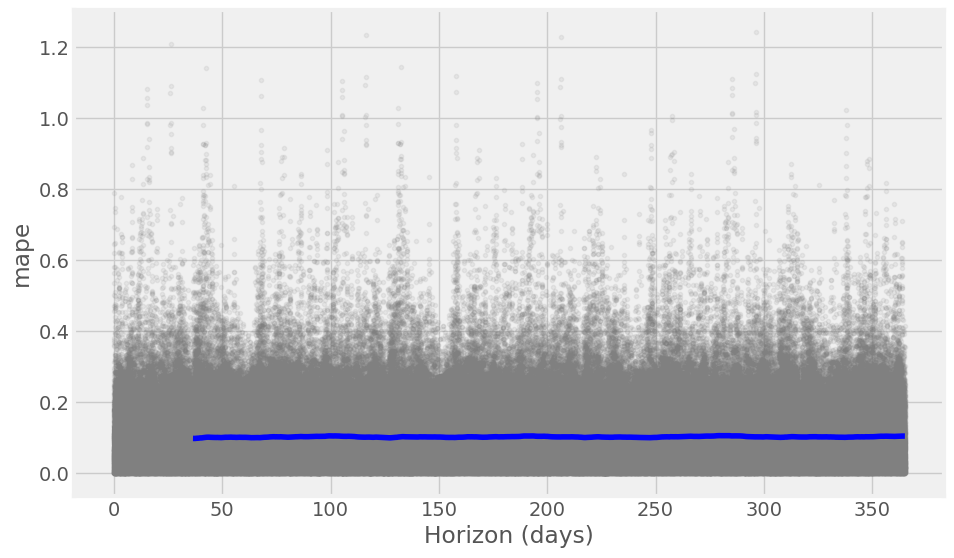

In [68]:
fig = plot_cross_validation_metric(df_cv, metric='mape')

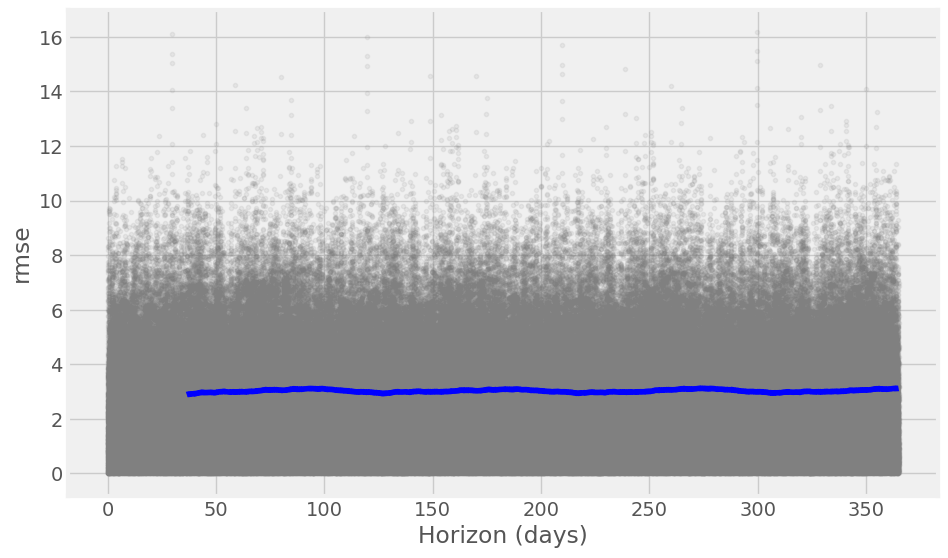

In [69]:
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [70]:
metrics['rmse'].mean()

3.0238822608882594

# 7.0 - Hyperparameter Fine Tunnig

In [ ]:
import itertools
import numpy as np
from prophet import Prophet

param_grid_seasonality = {'period': [30.5, 365.25],
                          'fourier_order': [3, 5, 10],
                         }

all_params = []

for params_seasonality in itertools.product(*param_grid_seasonality.values()):
    params = {
        'name': f'season_{params_seasonality[0]}_{params_seasonality[1]}',
        'fourier_order': params_seasonality[1],
        'period': params_seasonality[0],
    }
    all_params.append(params)

rmses = []

for params in all_params:
    print(f"Treinando modelo com parâmetros: {params}")
    
    df_train2 = df_train[df_train['ds'].dt.year <= 2021].copy()
    df_test2  = df_train[df_train['ds'].dt.year >  2021].copy()
    
    m = Prophet()
    m.add_seasonality(name=params['name'], period=params['period'], fourier_order=params['fourier_order'])
    m.fit(df_train2)

    df_forecast = m.predict(df_test2)
    
    y_true = df_test2['y'].values
    y_pred = df_forecast['yhat'].values
    rmse = np.sqrt(((y_true - y_pred) ** 2).mean())
    rmses.append(rmse)

for i, params in enumerate(all_params):
    print(f"Parâmetros: {params}, RMSE: {rmses[i]}")

Treinando modelo com parâmetros: {'name': 'season_30.5_3', 'fourier_order': 3, 'period': 30.5}


20:22:33 - cmdstanpy - INFO - Chain [1] start processing
20:24:34 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'name': 'season_30.5_5', 'fourier_order': 5, 'period': 30.5}


20:24:59 - cmdstanpy - INFO - Chain [1] start processing
20:26:47 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'name': 'season_30.5_10', 'fourier_order': 10, 'period': 30.5}


20:27:17 - cmdstanpy - INFO - Chain [1] start processing
20:28:41 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'name': 'season_365.25_3', 'fourier_order': 3, 'period': 365.25}


20:29:05 - cmdstanpy - INFO - Chain [1] start processing
20:30:40 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'name': 'season_365.25_5', 'fourier_order': 5, 'period': 365.25}


20:31:05 - cmdstanpy - INFO - Chain [1] start processing
20:32:40 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'name': 'season_365.25_10', 'fourier_order': 10, 'period': 365.25}


20:33:13 - cmdstanpy - INFO - Chain [1] start processing
20:35:18 - cmdstanpy - INFO - Chain [1] done processing


Parâmetros: {'name': 'season_30.5_3', 'fourier_order': 3, 'period': 30.5}, RMSE: 2.995240982430296
Parâmetros: {'name': 'season_30.5_5', 'fourier_order': 5, 'period': 30.5}, RMSE: 2.9940404387538964
Parâmetros: {'name': 'season_30.5_10', 'fourier_order': 10, 'period': 30.5}, RMSE: 2.992525688938007
Parâmetros: {'name': 'season_365.25_3', 'fourier_order': 3, 'period': 365.25}, RMSE: 2.9790125015503306
Parâmetros: {'name': 'season_365.25_5', 'fourier_order': 5, 'period': 365.25}, RMSE: 2.9783254014663045
Parâmetros: {'name': 'season_365.25_10', 'fourier_order': 10, 'period': 365.25}, RMSE: 2.9788047550594214


In [ ]:
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
tuning_results.sort_values('rmse').head()

,name,fourier_order,period,rmse
4,season_365.25_5,5,365.25,2.978325
5,season_365.25_10,10,365.25,2.978805
3,season_365.25_3,3,365.25,2.979013
2,season_30.5_10,10,30.50,2.992526
1,season_30.5_5,5,30.50,2.994040


In [40]:
param_grid = {'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
              'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
              'seasonality_mode': ['additive', 'multiplicative']
             }

all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

rmses = []

for params in all_params:
    print(f"Treinando modelo com parâmetros: {params}")
    
    df_train2 = df_train[df_train['ds'].dt.year <= 2021].copy()
    df_test2  = df_train[df_train['ds'].dt.year >  2021].copy()
    
    m = Prophet(changepoint_prior_scale=params['changepoint_prior_scale'], 
                seasonality_prior_scale=params['seasonality_prior_scale'],
                seasonality_mode=params['seasonality_mode']
               )
    
    m.fit(df_train2)
    
    df_forecast = m.predict(df_test2)
    
    y_true = df_test2['y'].values
    y_pred = df_forecast['yhat'].values
    rmse = np.sqrt(((y_true - y_pred) ** 2).mean())
    rmses.append(rmse)

for i, params in enumerate(all_params):
    print(f"Parâmetros: {params}, RMSE: {rmses[i]}")


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive'}


19:34:22 - cmdstanpy - INFO - Chain [1] start processing
19:34:46 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'multiplicative'}


19:34:57 - cmdstanpy - INFO - Chain [1] start processing
19:35:21 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'}


19:35:33 - cmdstanpy - INFO - Chain [1] start processing
19:36:00 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}


19:36:11 - cmdstanpy - INFO - Chain [1] start processing
19:36:58 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'}


19:37:10 - cmdstanpy - INFO - Chain [1] start processing
19:37:33 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'}


19:37:45 - cmdstanpy - INFO - Chain [1] start processing
19:38:08 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'}


19:38:20 - cmdstanpy - INFO - Chain [1] start processing
19:38:42 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'}


19:38:54 - cmdstanpy - INFO - Chain [1] start processing
19:39:23 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive'}


19:39:35 - cmdstanpy - INFO - Chain [1] start processing
19:40:56 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'multiplicative'}


19:41:08 - cmdstanpy - INFO - Chain [1] start processing
19:42:22 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'}


19:42:33 - cmdstanpy - INFO - Chain [1] start processing
19:43:53 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}


19:44:05 - cmdstanpy - INFO - Chain [1] start processing
19:44:48 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'}


19:44:59 - cmdstanpy - INFO - Chain [1] start processing
19:46:37 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'}


19:46:48 - cmdstanpy - INFO - Chain [1] start processing
19:47:33 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'}


19:47:46 - cmdstanpy - INFO - Chain [1] start processing
19:49:29 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'}


19:49:41 - cmdstanpy - INFO - Chain [1] start processing
19:50:25 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive'}


19:50:36 - cmdstanpy - INFO - Chain [1] start processing
19:52:49 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'multiplicative'}


19:53:01 - cmdstanpy - INFO - Chain [1] start processing
19:54:48 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'}


19:54:59 - cmdstanpy - INFO - Chain [1] start processing
19:56:19 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}


19:56:30 - cmdstanpy - INFO - Chain [1] start processing
19:58:26 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'}


19:58:37 - cmdstanpy - INFO - Chain [1] start processing
20:00:34 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'}


20:00:45 - cmdstanpy - INFO - Chain [1] start processing
20:03:05 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'}


20:03:16 - cmdstanpy - INFO - Chain [1] start processing
20:05:52 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'}


20:06:04 - cmdstanpy - INFO - Chain [1] start processing
20:08:01 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive'}


20:08:12 - cmdstanpy - INFO - Chain [1] start processing
20:11:09 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'multiplicative'}


20:11:21 - cmdstanpy - INFO - Chain [1] start processing
20:13:35 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'}


20:13:46 - cmdstanpy - INFO - Chain [1] start processing
20:16:08 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}


20:16:20 - cmdstanpy - INFO - Chain [1] start processing
20:18:49 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'}


20:19:00 - cmdstanpy - INFO - Chain [1] start processing
20:21:54 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'}


20:22:06 - cmdstanpy - INFO - Chain [1] start processing
20:23:44 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'}


20:23:55 - cmdstanpy - INFO - Chain [1] start processing
20:25:59 - cmdstanpy - INFO - Chain [1] done processing


Treinando modelo com parâmetros: {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'}


20:26:10 - cmdstanpy - INFO - Chain [1] start processing
20:28:59 - cmdstanpy - INFO - Chain [1] done processing


Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive'}, RMSE: 2.982313768476301
Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'multiplicative'}, RMSE: 2.9829596708187207
Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'}, RMSE: 2.9827425569703188
Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}, RMSE: 2.9825715834469837
Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'}, RMSE: 2.9825691543984827
Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'}, RMSE: 2.9825229520978573
Parâmetros: {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'}, RMSE: 2.9827404004289195
Parâmetros: {'changep

In [41]:
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
tuning_results.sort_values('rmse').head()

,changepoint_prior_scale,seasonality_prior_scale,seasonality_mode,rmse
28,0.5,1.0,additive,2.977159
26,0.5,0.1,additive,2.977231
30,0.5,10.0,additive,2.977446
20,0.1,1.0,additive,2.977921
22,0.1,10.0,additive,2.977967


# 8.0 - Model Evaluation

In [71]:
df_test['weekofyear'] = df_test['weekofyear'].astype('int32')
df_test.dtypes

ds              datetime64[ns]
y                      float64
date            datetime64[ns]
hour                     int32
dayofweek                int32
weekday                  int32
weekday_name            object
quarter                  int32
month                    int32
year                     int32
dayofyear                int32
dayofmonth               int32
weekofyear               int32
season                   int64
dtype: object

In [73]:
params = {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'}

final_model = Prophet(changepoint_prior_scale=params['changepoint_prior_scale'], 
                      seasonality_prior_scale=params['seasonality_prior_scale'],
                      seasonality_mode=params['seasonality_mode'])

final_model.add_seasonality(name='season_365.25_5', period=365.25, fourier_order=5)

final_model.fit(df_train)

17:16:19 - cmdstanpy - INFO - Chain [1] start processing
17:19:06 - cmdstanpy - INFO - Chain [1] done processing


In [74]:
forecast = final_model.predict(df_test)

In [75]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-01-01 00:00:00,23.113791,20.105871,27.923663,23.113791,23.113791,0.868140,0.868140,0.868140,-1.711930,...,0.045105,0.045105,0.045105,1.310365,1.310365,1.310365,0.0,0.0,0.0,23.981931
1,2023-01-01 01:00:00,23.113760,19.729077,27.372106,23.113760,23.113760,0.597599,0.597599,0.597599,-1.985984,...,0.046918,0.046918,0.046918,1.311337,1.311337,1.311337,0.0,0.0,0.0,23.711359
2,2023-01-01 02:00:00,23.113730,19.736959,27.307121,23.113730,23.113730,0.315450,0.315450,0.315450,-2.271191,...,0.048281,0.048281,0.048281,1.312305,1.312305,1.312305,0.0,0.0,0.0,23.429180
3,2023-01-01 03:00:00,23.113699,19.510461,26.960885,23.113699,23.113699,0.091146,0.091146,0.091146,-2.498074,...,0.049173,0.049173,0.049173,1.313266,1.313266,1.313266,0.0,0.0,0.0,23.204845
4,2023-01-01 04:00:00,23.113668,19.558158,26.773135,23.113668,23.113668,0.004923,0.004923,0.004923,-2.586382,...,0.049577,0.049577,0.049577,1.314222,1.314222,1.314222,0.0,0.0,0.0,23.118592


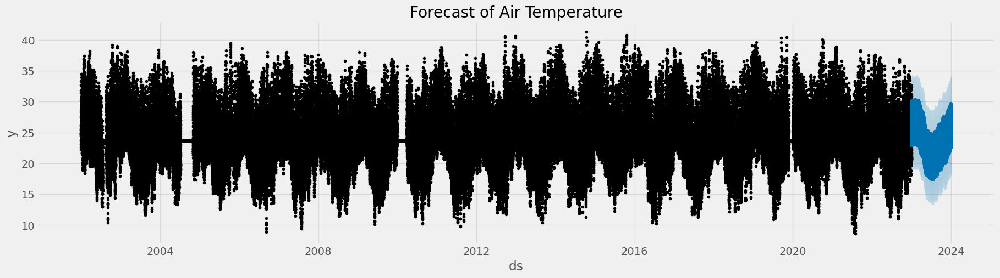

In [76]:
fig, ax = plt.subplots(figsize=(20, 5))
fig = final_model.plot(forecast, ax=ax)
ax.set_title('Forecast of Air Temperature')
plt.show()

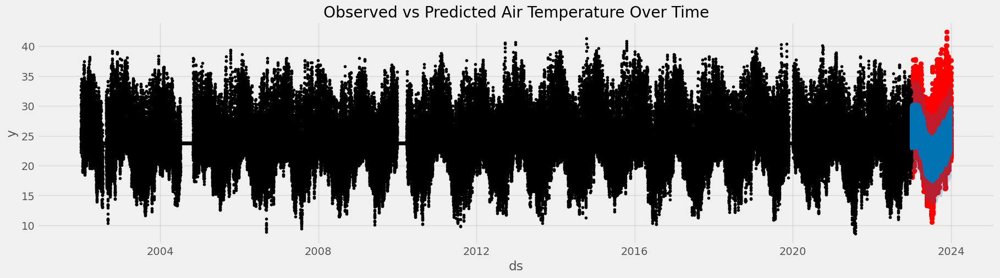

In [77]:
fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(df_test['ds'], df_test['y'], color='r')
fig = final_model.plot(forecast, ax=ax)
ax.set_title('Observed vs Predicted Air Temperature Over Time')
fig.show()

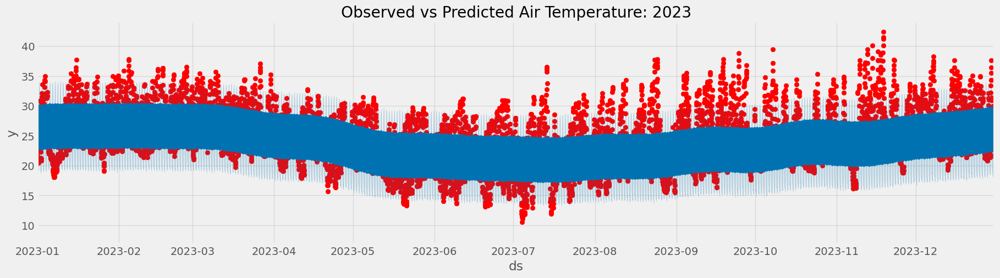

In [84]:
lower_limit = datetime.strptime('01-01-2023', '%d-%m-%Y')
upper_limit = datetime.strptime('31-12-2023', '%d-%m-%Y')

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(df_test['ds'], df_test['y'], color='r')
fig = final_model.plot(forecast, ax=ax)
ax.set_xbound(lower=lower_limit, upper=upper_limit)
ax.set_title('Observed vs Predicted Air Temperature: 2023')
plt.show()


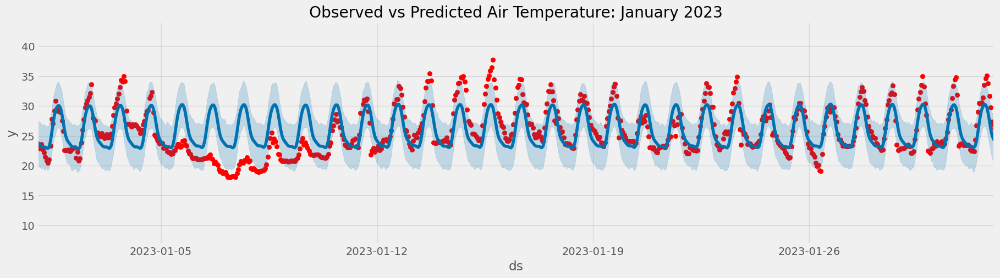

In [85]:
lower_limit = datetime.strptime('01-01-2023', '%d-%m-%Y')
upper_limit = datetime.strptime('01-02-2023', '%d-%m-%Y')

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(df_test['ds'], df_test['y'], color='r')
fig = final_model.plot(forecast, ax=ax)
ax.set_xbound(lower=lower_limit, upper=upper_limit)
ax.set_title('Observed vs Predicted Air Temperature: January 2023')
plt.show()


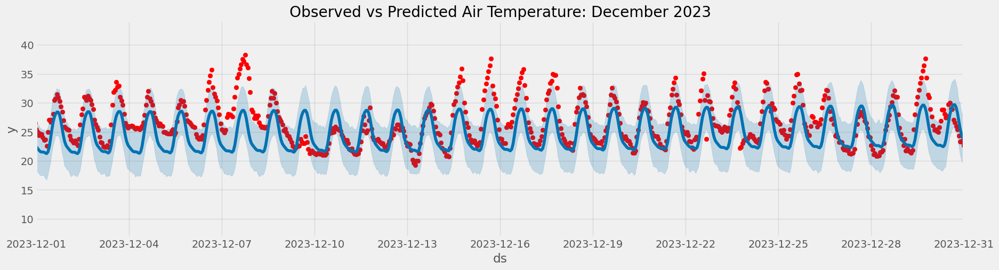

In [80]:
lower_limit = datetime.strptime('01-12-2023', '%d-%m-%Y')
upper_limit = datetime.strptime('31-12-2023', '%d-%m-%Y')

fig, ax = plt.subplots(figsize=(20, 5))
ax.scatter(df_test['ds'], df_test['y'], color='r')
fig = final_model.plot(forecast, ax=ax)
ax.set_xbound(lower=lower_limit, upper=upper_limit)
ax.set_title('Observed vs Predicted Air Temperature: December 2023')
plt.show()


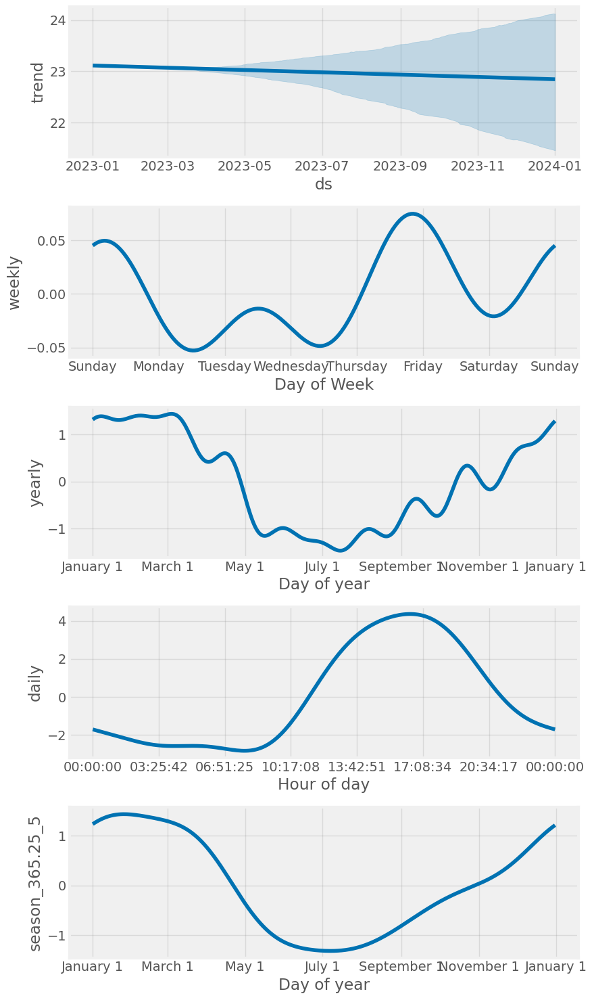

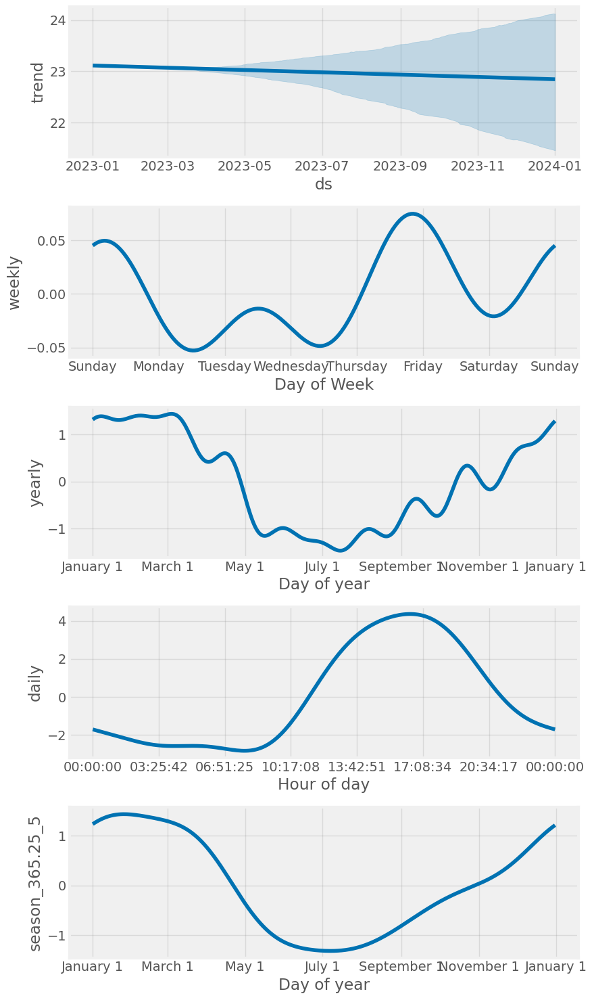

In [81]:
final_model.plot_components(forecast)

In [82]:
mse =mean_squared_error(y_true=df_test['y'], y_pred=forecast['yhat'])

rmse =np.sqrt(mse)

mae = mean_absolute_error(y_true=df_test['y'], y_pred=forecast['yhat'])

mape = mean_absolute_percentage_error(y_true=df_test['y'], y_pred=forecast['yhat'])

In [83]:
metrics = pd.DataFrame({'MSE':  [mse],
                        'RMSE': [rmse],
                        'MAE':  [mae],
                        'MAPE': [mape]}, index=['Metrics'])

metrics

,MSE,RMSE,MAE,MAPE
Metrics,10.525436,3.244293,2.464786,9.944344


- The model shows a **RMSE of 3.25°C** and a **MAE of 2.47°C**, indicating that the predictions deviate from actual temperatures by these amounts on average. 
- Additionally, the **MAPE of 9.96%** suggests that the average prediction error is about 9.96% relative to the actual values.

- Different strategies for handling missing data and fine-tuning hyperparameters were tested, but no substantial improvement in the model's performance was observed. 
- This indicates either a limitation of Prophet in accurately predicting temperatures or the inherent complexity of the task. 
- To further explore these findings and enhance predictive accuracy, we plan to implement a new forecasting model using XGBoost. XGBoost is known for its capability to handle complex relationships in data and may offer insights into improving temperature predictions, potentially overcoming the challenges encountered with Prophet. This comparative analysis aims to provide deeper insights and inform future strategies for temperature forecasting applications.